In [ ]:

# Import NumPy for array handling
#
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from radmc3dPy import *
import subprocess as p

#
# A simple grid refinement function
#
def grid_refine_inner_edge(x_orig,nlev,nspan):
    x     = x_orig.copy()
    rev   = x[0]>x[1]
    for ilev in range(nlev):
        x_new = 0.5 * ( x[1:nspan+1] + x[:nspan] )
        x_ref = np.hstack((x,x_new))
        x_ref.sort()
        x     = x_ref
        if rev:
            x = x[::-1]
    return x
#
# Some natural constants
#
au  = 1.49598e13     # Astronomical Unit       [cm]
pc  = 3.08572e18     # Parsec                  [cm]
ms  = 1.98892e33     # Solar mass              [g]
ts  = 5.78e3         # Solar temperature       [K]
ls  = 3.8525e33      # Solar luminosity        [erg/s]
rs  = 6.96e10        # Solar radius            [cm]
ss  = 5.6703e-5      # Stefan-Boltzmann const  [erg/cm^2/K^4/s]
kk  = 1.3807e-16     # Bolzmann's constant     [erg/K]
mp  = 1.6726e-24     # Mass of proton          [g]
GG  = 6.67408e-08    # Gravitational constant  [cm^3/g/s^2]
pi  = np.pi          # Pi

#
# Star parameters
#
mstar    = ms
rstar    = rs
tstar    = ts
pstar    = np.array([0.,0.,0.])

#
# First make a simple analytical disk model roughly along the
# lines of Chiang & Goldreich (1997), but with just a single
# vertical layer and with a constant radiative incidence angle.
#
flang    = 0.05      # The assumed constant radiative incidence angle
nr       = 500        # Nr of radial grid points
rin      = 10*au     # Inner radius
rout     = 100*au    # Outer radius
nlev_rin = 12        # Grid refinement at the inner edge: nr of cycles
nspan_rin= 3         # Grid refinement at the inner edge: nr of cells each cycle
ri       = np.logspace(np.log10(rin),np.log10(rout),nr+1)
ri       = grid_refine_inner_edge(ri,nlev_rin,nspan_rin)   # Refinement at inner edge
rc       = 0.5 * ( ri[:-1] + ri[1:] )
nr       = len(rc)   # Recompute nr, because of refinement at inner edge
r        = rc        # The radial grid of the analytic disk model
lstar    = 4*pi*rstar**2*ss*tstar**4   # Stellar luminosity
firr     = flang*lstar/(4*pi*r**2)     # Irradiative flux
tmid     = (firr/ss)**0.25             # Estimate of midplane temperature
cs       = np.sqrt(kk*tmid/(2.3*mp))   # Isothermal sound speed at midplane
omk      = np.sqrt(GG*mstar/r**3)      # The Kepler angular frequency     
hp       = cs/omk                      # The pressure scale height
hpr      = hp/r                        # The dimensionless hp

#
# Vertical grid parameters (theta-grid in spherical coordinates)
#
ntheta   = 100
zrmax    = 0.5
thetaup  = np.pi*0.5 - 0.5e0

#
# Make the theta and phi coordinates
#
nphi     = 10
thetai   = np.linspace(thetaup,0.5e0*np.pi,ntheta+1)
phii     = np.linspace(0.e0,np.pi*2.e0,nphi+1)
thetac   = 0.5 * ( thetai[0:ntheta] + thetai[1:ntheta+1] )
phic     = 0.5 * ( phii[0:nphi] + phii[1:nphi+1] )

#
# Make the 2-D grid (actually 3-D but with axisymmetry)
#
qq       = np.meshgrid(rc,thetac,phic,indexing='ij')
rr       = qq[0]
tt       = qq[1]
zr       = np.pi/2.e0 - qq[1]

# Monte Carlo parameters
#
nphot    = 1000000

#
# Write the wavelength_micron.inp file
#
lam1     = 0.1e0
lam2     = 7.0e0
lam3     = 25.e0
lam4     = 1.0e4
n12      = 20
n23      = 100
n34      = 30
lam12    = np.logspace(np.log10(lam1),np.log10(lam2),n12,endpoint=False)
lam23    = np.logspace(np.log10(lam2),np.log10(lam3),n23,endpoint=False)
lam34    = np.logspace(np.log10(lam3),np.log10(lam4),n34,endpoint=True)
lam      = np.concatenate([lam12,lam23,lam34])
nlam     = lam.size
    


In [ ]:


def rad_setup(radius, amplitude, location, width):
    #
    # Disk parameters
    #
    sigmag0  = 1e1               # Sigma gas at 1 AU
    sigmad0  = sigmag0 * 0.01    # Sigma dust at 1 AU
    plsig    = -1.0e0            # Powerlaw of the surface density
    sigmad   = (sigmad0 * (r/au)**plsig)#*np.exp(-(r/(60*au)))   # The surface density profile

    def pert(radius, amplitude, location, width):
        value = amplitude*np.exp(-((radius-location)/width)**2)
        return value

    sigmad *= (1 + pert(radius, amplitude, location, width)) #Addition of a perturbation

    #
    # Expand the 1-D analytic model to 2-D
    #
    sigmad_3d  = np.meshgrid(sigmad,thetac,phic,indexing='ij')[0]
    hh         = np.meshgrid(hp,thetac,phic,indexing='ij')[0]
    hhr        = np.meshgrid(hpr,thetac,phic,indexing='ij')[0]

    #
    # Make the dust density model
    #
    rhod     = sigmad_3d / (np.sqrt(2.e0*np.pi)*hh) * np.exp(-((zr**2/hhr**2)/2.e0))

    #
    # Write the wavelength file
    #
    with open('wavelength_micron.inp','w+') as f:
        f.write('%d\n'%(nlam))
        for value in lam:
            f.write('%13.6e\n'%(value))
    #
    #
    # Write the stars.inp file
    #
    with open('stars.inp','w+') as f:
        f.write('2\n')
        f.write('1 %d\n\n'%(nlam))
        f.write('%13.6e %13.6e %13.6e %13.6e %13.6e\n\n'%(rstar,mstar,pstar[0],pstar[1],pstar[2]))
        for value in lam:
            f.write('%13.6e\n'%(value))
        f.write('\n%13.6e\n'%(-tstar))
    #
    # Write the grid file
    #
    with open('amr_grid.inp','w+') as f:
        f.write('1\n')                       # iformat
        f.write('0\n')                       # AMR grid style  (0=regular grid, no AMR)
        f.write('100\n')                     # Coordinate system: spherical
        f.write('0\n')                       # gridinfo
        f.write('1 1 1\n')                   # Include r,theta coordinates
        f.write('%d %d %d\n'%(nr,ntheta,nphi))  # Size of grid
        for value in ri:
            f.write('%13.6e\n'%(value))      # X coordinates (cell walls)
        for value in thetai:
            f.write('%13.6e\n'%(value))      # Y coordinates (cell walls)
        for value in phii:
            f.write('%13.6e\n'%(value))      # Z coordinates (cell walls)
    #
    # Write the density file
    #
    with open('dust_density.inp','w+') as f:
        f.write('1\n')                       # Format number
        f.write('%d\n'%(nr*ntheta*nphi))     # Nr of cells
        f.write('1\n')                       # Nr of dust species
        data = rhod.ravel(order='F')         # Create a 1-D view, fortran-style indexing
        data.tofile(f, sep='\n', format="%13.6e")
        f.write('\n')
    #
    # Dust opacity control file
    #
    with open('dustopac.inp','w+') as f:
        f.write('2               Format number of this file\n')
        f.write('1               Nr of dust species\n')
        f.write('============================================================================\n')
        f.write('1               Way in which this dust species is read\n')
        f.write('0               0=Thermal grain\n')
        f.write('silicate        Extension of name of dustkappa_***.inp file\n')
        f.write('----------------------------------------------------------------------------\n')
    #
    # Write the radmc3d.inp control file
    #
    with open('radmc3d.inp','w+') as f:
        f.write('nphot = %d\n'%(nphot))
        f.write('scattering_mode_max = 1\n')
        f.write('iranfreqmode = 1\n')
        
    return sigmad



In [145]:

from IPython.display import clear_output
def pert_param_search(amp_initial, amp_final, loc_initial, loc_final, width_initial, width_final, a_step, l_step, w_step):
    #Compute the noise level
    rad_setup(r, 0, 1, 1)
    p.run(['radmc3d', 'mctherm', 'setthreads', '6'])
    data = analyze.readData(dtemp = True)
    data.readDustTemp()
    NoPertTemp = np.average(np.array(data.dusttemp[:,:,:,0].T), axis = 0)
    clear_output()
    
    #Define relevant lists
    sigmad_list = [[[[] for k in range(0, int((amp_final - amp_initial) / a_step))] for j in range(0, int((loc_final - loc_initial) / l_step))] for i in range(0, int((width_final - width_initial) / w_step))] 
    temp_list = [[[[] for k in range(0, int((amp_final - amp_initial) / a_step))] for j in range(0, int((loc_final - loc_initial) / l_step))] for i in range(0, int((width_final - width_initial) / w_step))]
    for i in range(0, int((width_final - width_initial) / w_step)):
        for j in range(0, int((loc_final - loc_initial) / l_step)):
            for k in range(0, int((amp_final - amp_initial) / a_step)):
                sigmad = rad_setup(r, k*a_step + amp_initial, j*l_step + loc_initial, i*w_step + width_initial) #Write the input files
                p.run(['radmc3d', 'mctherm', 'setthreads', '6']) #Run radmc3d to create output files
                sigmad_list[i][j][k] = np.array(sigmad)
                data = analyze.readData(dtemp = True)
                data.readDustTemp()
                temp_list[i][j][k] = np.average(np.array(data.dusttemp[:,:,:,0].T), axis = 0)
                clear_output()
        
    
    return sigmad_list, temp_list, NoPertTemp, data;

sigmad_list, temp_list, NoPertTemp, data = pert_param_search(3, 11, 25*au, 100*au, .7*au, 1.5*au, 2, 25*au, .2*au)

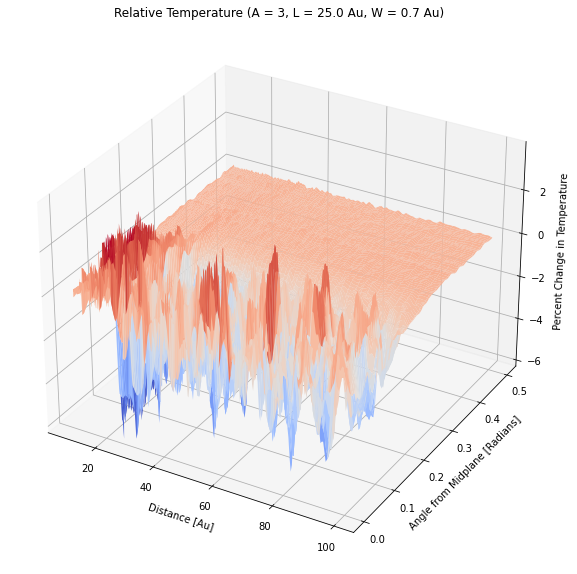

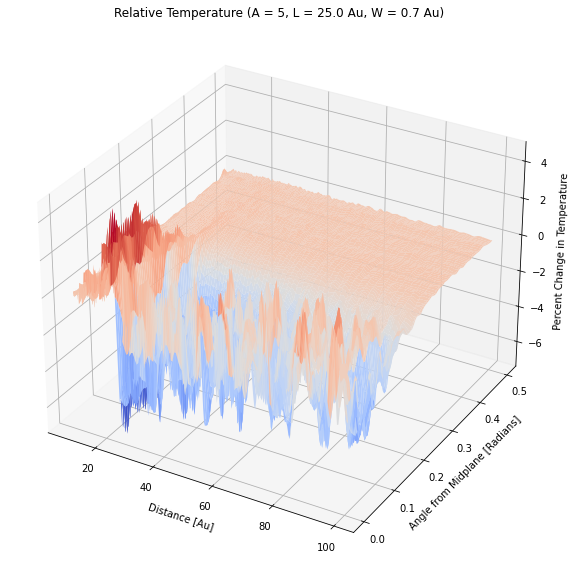

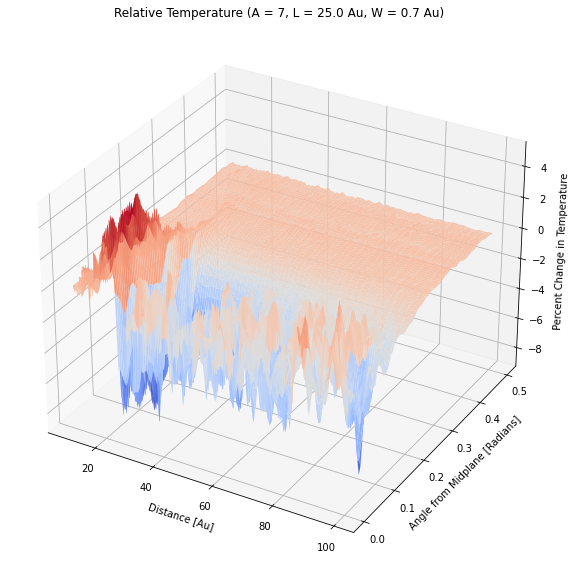

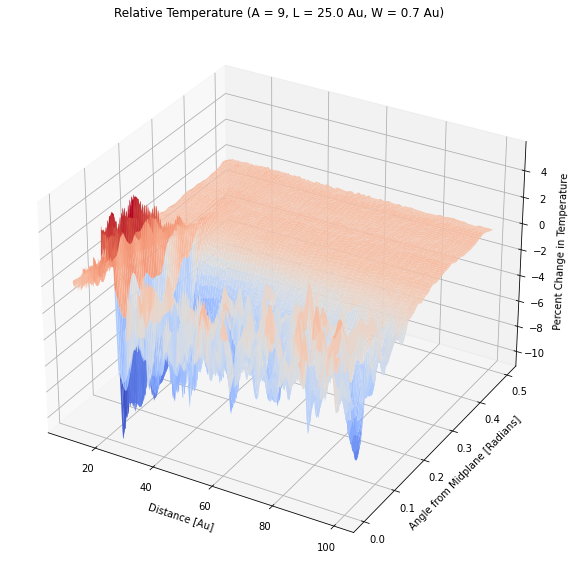

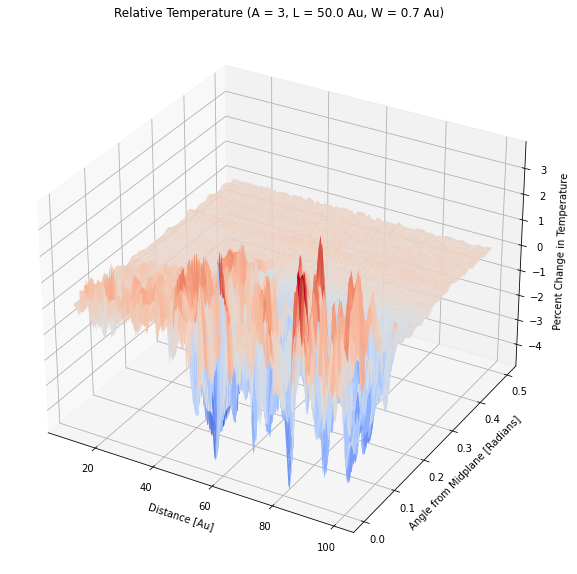

...

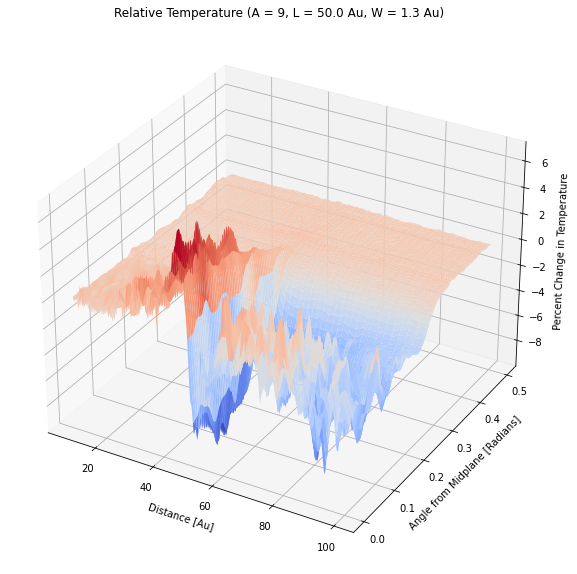

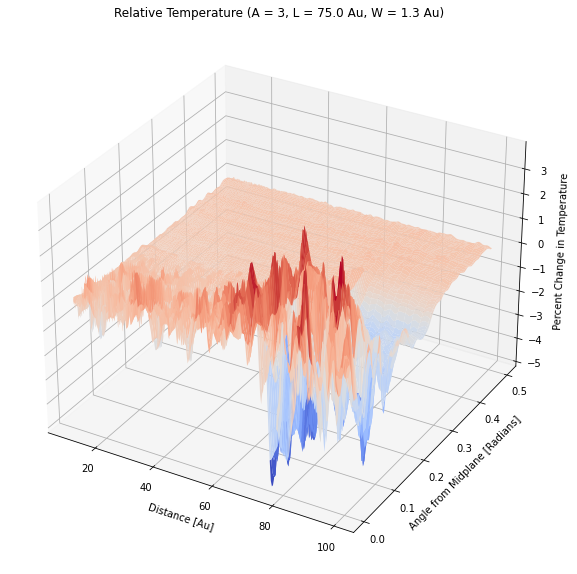

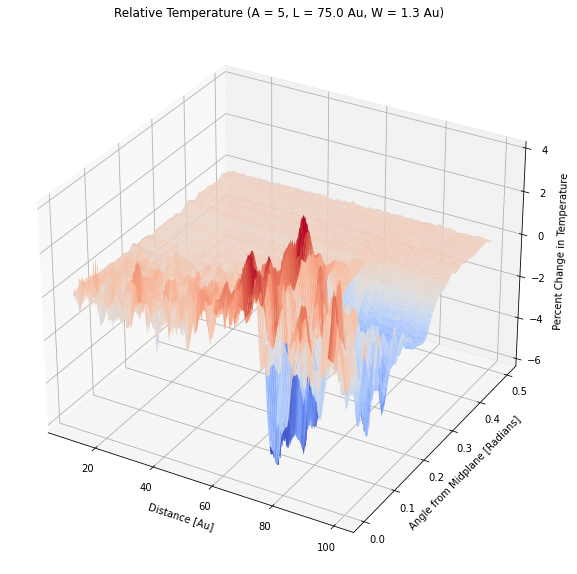

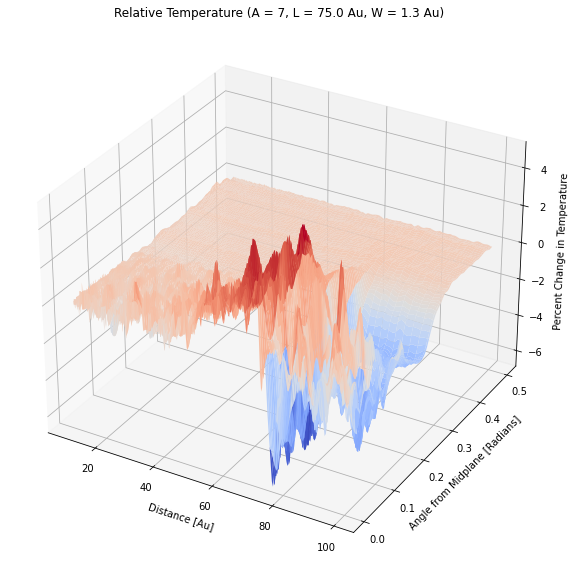

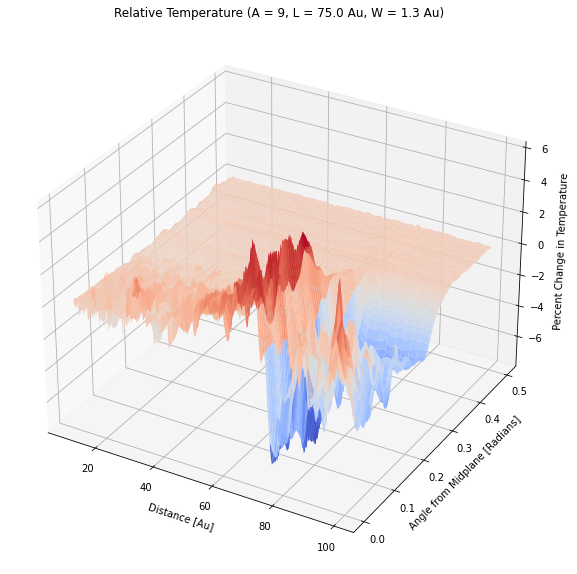

In [152]:
from matplotlib.pyplot import cm
from scipy import ndimage
amp_initial, amp_final, loc_initial, loc_final, width_initial, width_final, a_step, l_step, w_step = 3, 11, 25*au, 100*au, .7*au, 1.5*au, 2, 25*au, .2*au
for i in range(0, int((width_final - width_initial) / w_step)):
        for j in range(0, int((loc_final - loc_initial) / l_step)):
            for k in range(0, int((amp_final - amp_initial) / a_step)):
#                 plt.plot(r/au, sigmad_list[i][j][k])
#                 plt.title('Surface Density (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#                 plt.xlabel('Distance [AU]')
#                 plt.ylabel('Dust Surface Density [$g/cm^2$]')
#                 plt.show()
                
#                 fig, ax = plt.subplots()
#                 c = ax.contourf(data.grid.x/natconst.au, np.pi/2.-data.grid.y, temp_list_mean[i][j][k], 100, cmap = cm.coolwarm)
#                 ax.set_xlabel('r [AU]')
#                 ax.set_ylabel(r'$\pi/2-\theta$')
#                 ax.set_title('Temperature Contour (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#                 ax.set_xscale('log')
#                 Ticks = np.linspace(15, 185, 18)
#                 cb = plt.colorbar(c, ticks = Ticks)
#                 cb.set_label('T [K]', rotation=270.)


#                 c = ax.contour(data.grid.x/natconst.au, np.pi/2.-data.grid.y, temp_list_mean[i][j][k], 15,  colors='k', linestyles='solid')
#                 ax.clabel(c, inline=1, fontsize=10)
#                 plt.show()
                
#                 fig = plt.figure(figsize = (10,10))
#                 ax = plt.axes(projection='3d')
#                 ax.set_title('Temperature (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#                 ax.set_xlabel('Distance [Au]')
#                 ax.set_ylabel('Angle from Midplane [Radians]')
#                 ax.set_zlabel('Temperature [K]')

#                 X, Y = np.meshgrid(data.grid.x/natconst.au, np.pi/2.-data.grid.y)
#                 Z = temp_list[i][j][k]
#                 ax.plot_surface(X, Y, Z, cmap = cm.coolwarm)
#                 plt.show()
                
                fig = plt.figure(figsize = (10,10))
                ax = plt.axes(projection='3d')
                ax.set_title('Relative Temperature (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
                ax.set_xlabel('Distance [Au]')
                ax.set_ylabel('Angle from Midplane [Radians]')
                ax.set_zlabel('Percent Change in Temperature')

                X, Y = np.meshgrid(data.grid.x/natconst.au, np.pi/2.-data.grid.y)
                Z = sp.ndimage.filters.gaussian_filter((100*(temp_list[i][j][k] - NoPertTemp) / NoPertTemp), 1.25)
                ax.plot_surface(X, Y, Z, rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
                plt.show()
                

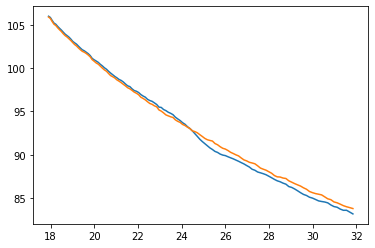

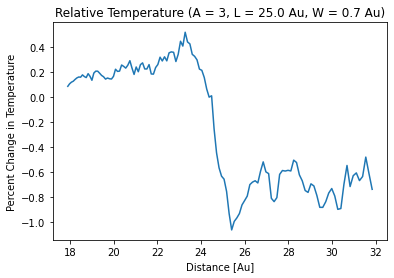

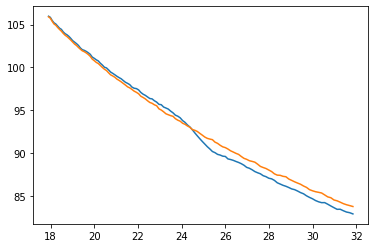

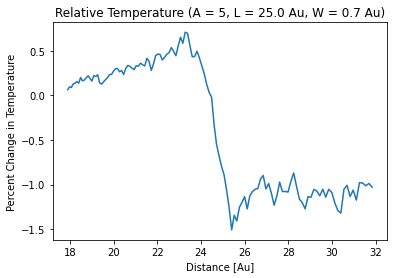

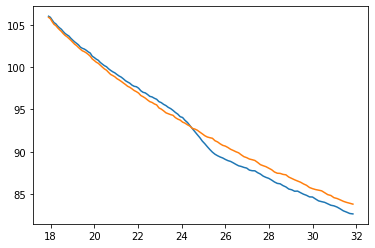

...

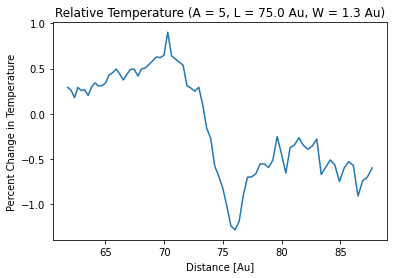

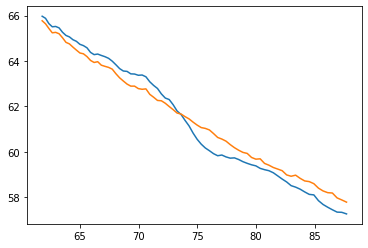

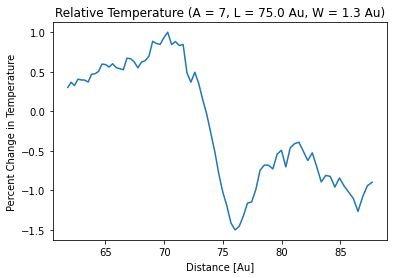

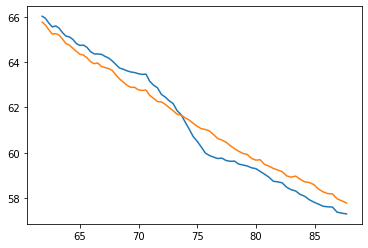

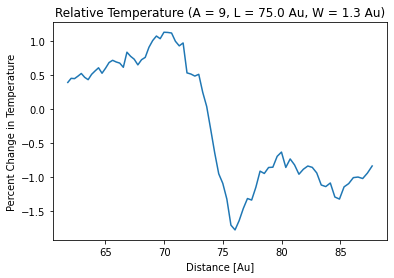

In [204]:
from matplotlib.pyplot import cm
from scipy import ndimage
amp_initial, amp_final, loc_initial, loc_final, width_initial, width_final, a_step, l_step, w_step = 3, 11, 25*au, 100*au, .7*au, 1.5*au, 2, 25*au, .2*au
for i in range(0, int((width_final - width_initial) / w_step)):
    for j in range(0, int((loc_final - loc_initial) / l_step)):
        for k in range(0, int((amp_final - amp_initial) / a_step)):
#             plt.plot(r/au, sigmad_list[i][j][k])
#             plt.title('Surface Density (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#             plt.xlabel('Distance [AU]')
#             plt.ylabel('Dust Surface Density [$g/cm^2$]')
#             plt.show()

#             fig, ax = plt.subplots()
#             c = ax.contourf(data.grid.x/natconst.au, np.pi/2.-data.grid.y, temp_list_mean[i][j][k], 100, cmap = cm.coolwarm)
#             ax.set_xlabel('r [AU]')
#             ax.set_ylabel(r'$\pi/2-\theta$')
#             ax.set_title('Temperature Contour (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#             ax.set_xscale('log')
#             Ticks = np.linspace(15, 185, 18)
#             cb = plt.colorbar(c, ticks = Ticks)
#             cb.set_label('T [K]', rotation=270.)


#             c = ax.contour(data.grid.x/natconst.au, np.pi/2.-data.grid.y, temp_list_mean[i][j][k], 15,  colors='k', linestyles='solid')
#             ax.clabel(c, inline=1, fontsize=10)
#             plt.show()

#             fig = plt.figure(figsize = (10,10))
#             ax = plt.axes(projection='3d')
#             ax.set_title('Temperature (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#             ax.set_xlabel('Distance [Au]')
#             ax.set_ylabel('Angle from Midplane [Radians]')
#             ax.set_zlabel('Temperature [K]')

#             X, Y = np.meshgrid(data.grid.x/natconst.au, np.pi/2.-data.grid.y)
#             Z = temp_list[i][j][k]
#             ax.plot_surface(X, Y, Z, cmap = cm.coolwarm)
#             plt.show()
            
            X = data.grid.x/natconst.au
            w = i*w_step + width_initial
            l = j*l_step + loc_initial
            #The index of X which corresponds to the value in X closest to the location of the perturbation
            l_index = np.abs(X - (l / au)).argmin()
            #Create a loop to find an equally spaced interval on either side of the perturbation
            for backward in range(1, l_index): 
                if abs(X[l_index] - X[l_index - backward]) <= 10*w / au: 
                    pass
                else:
                    B = backward
                    break
        
            for forward in range(1, len(X) - l_index):
                if abs(X[l_index] - X[l_index + forward]) <= 10*w / au:
                    pass
                else:
                    F = forward
                    break
                    
                    
            plt.plot(X[(l_index - B):(l_index + F)], np.average(temp_list[i][j][k], axis = 0)[(l_index - B):(l_index + F)])
            plt.plot(X[(l_index - B):(l_index + F)], np.average(NoPertTemp, axis = 0)[(l_index - B):(l_index + F)])
            plt.show()
                    
            fig, ax = plt.subplots()
            ax.set_title('Relative Temperature (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
            ax.set_xlabel('Distance [Au]')
            ax.set_ylabel('Percent Change in Temperature')
            ax.plot(X[(l_index - B):(l_index + F)], 100*(np.average(temp_list[i][j][k], axis = 0)[(l_index - B):(l_index + F)] - np.average(NoPertTemp, axis = 0)[(l_index - B):(l_index + F)]) / np.average(NoPertTemp, axis = 0)[(l_index - B):(l_index + F)])
            plt.show()
                
#             fig = plt.figure(figsize = (10,10))
#             ax = plt.axes(projection='3d')
#             ax.set_title('Relative Temperature (A = '+str(k*a_step + amp_initial)+', L = '+str((j*l_step + loc_initial)/au)+' Au, W = '+str((i*w_step + width_initial)/au)+' Au)')
#             ax.set_xlabel('Distance [Au]')
#             ax.set_ylabel('Angle from Midplane [Radians]')
#             ax.set_zlabel('Percent Change in Temperature')

#             X, Y = np.meshgrid(data.grid.x/natconst.au, np.pi/2.-data.grid.y)
#             Z = sp.ndimage.filters.gaussian_filter((100*(temp_list[i][j][k] - NoPertTemp) / NoPertTemp), 1.25)
#             ax.plot_surface(X, Y, Z, rcount = 100, ccount = 100, edgecolor = 'none', cmap = cm.coolwarm)
#             plt.show()

In [202]:
print(np.shape(np.average(temp_list[0][0][0][0:50], axis = 0)[10:20]))
print(np.shape(temp_list[0][0][0][0:50][10:20]))

(10,)
(10, 536)


In [ ]:
amp_initial, amp_final, loc_initial, loc_final, width_initial, width_final, a_step, l_step, w_step = 1, 9, 15*au, 95*au, .5*au, 1.3*au, 2, 20*au, .2*au
#Create a loop to run through all perturbation combinations
for i in range(0, int((width_final - width_initial) / w_step)):
    for j in range(0, int((loc_final - loc_initial) / l_step)):
        for k in range(0, int((amp_final - amp_initial) / a_step)):
            X = data.grid.x/natconst.au
            w = i*w_step + width_initial
            l = j*l_step + loc_initial
            #The index of X which corresponds to the value in X closest to the location of the perturbation
            l_index = np.abs(X - (l / au)).argmin()
            #Create a loop to find an equally spaced interval on either side of the perturbation
            for backward in range(1, l_index): 
                if abs(X[l_index] - X[l_index - backward]) <= 2*w / au: 
                    pass
                else:
                    B = backward
                    break
        
            for forward in range(1, len(X) - l_index):
                if abs(X[l_index] - X[l_index + forward]) <= *w / au:
                    pass
                else:
                    F = forward
                    break
                
            
            
            print(X[(l_index - B):(l_index + F)])

In [ ]:
print(np.shape(temp_list[0][0][0][0]))
print(np.shape(temp_list))

In [ ]:
#
# Make sure to have done the following beforhand:
#
#  First compile RADMC-3D
#  Then run:
#   python problem_setup.py
#   radmc3d mctherm
#

dpc = 140.     # Distance in parsec (for conversion to Jy/pixel in 1.3 mm map)

#
# Make and plot image of full disk at 1.3 mm: thermal dust emission
#
makeImage(npix=200,incl=60.,phi=30.,wav=1.0e3,sizeau=200)   # This calls radmc3d 
im_mmPrePert1 = readImage()
plt.figure()
plotImage(im_mmPrePert1,au=True,log=True,maxlog=3,bunit='jy/pixel',dpc=dpc,cmap='magma')
plt.show()

    
#
# Make and plot image of full disk at 1 microns: scattered light
#
makeImage(npix=200,incl=60.,phi=30.,wav=10,sizeau=200)   # This calls radmc3d 
im_1PrePert2 = readImage()
plt.figure()
plotImage(im_1PrePert2,au=True,log=True,vmax=-10,vmin=-15,bunit='inu',cmap='hot')
plt.show()